# Import the Libraries

In [35]:
#import numpy as np
#import pandas as pd
#import datetime
import matplotlib
import matplotlib.pyplot as plt
from matplotlib import rcParams
from matplotlib import colors
import seaborn as sns
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt, numpy as np
from sklearn.cluster import AgglomerativeClustering
from matplotlib.colors import ListedColormap
from sklearn import metrics
import warnings
import sys
if not sys.warnoptions:
    warnings.simplefilter("ignore")
np.random.seed(42)

In [26]:
customer = pd.read_csv("/Users/liujingna/Downloads/marketing_campaign.csv",sep="\t")
customer.head(5)
customer.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2240 entries, 0 to 2239
Data columns (total 29 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   ID                   2240 non-null   int64  
 1   Year_Birth           2240 non-null   int64  
 2   Education            2240 non-null   object 
 3   Marital_Status       2240 non-null   object 
 4   Income               2216 non-null   float64
 5   Kidhome              2240 non-null   int64  
 6   Teenhome             2240 non-null   int64  
 7   Dt_Customer          2240 non-null   object 
 8   Recency              2240 non-null   int64  
 9   MntWines             2240 non-null   int64  
 10  MntFruits            2240 non-null   int64  
 11  MntMeatProducts      2240 non-null   int64  
 12  MntFishProducts      2240 non-null   int64  
 13  MntSweetProducts     2240 non-null   int64  
 14  MntGoldProds         2240 non-null   int64  
 15  NumDealsPurchases    2240 non-null   i

In [9]:
for column in customer.columns:
    # Check if the column's data type is 'object'
    if customer[column].dtype == 'object':
        print(f"Value counts for {column}:")
        print(customer[column].value_counts())
        print("\n")

Value counts for Education:
Education
Graduation    1127
PhD            486
Master         370
2n Cycle       203
Basic           54
Name: count, dtype: int64


Value counts for Marital_Status:
Marital_Status
Married     864
Together    580
Single      480
Divorced    232
Widow        77
Alone         3
Absurd        2
YOLO          2
Name: count, dtype: int64


Value counts for Dt_Customer:
Dt_Customer
31-08-2012    12
12-09-2012    11
14-02-2013    11
12-05-2014    11
20-08-2013    10
              ..
05-08-2012     1
18-11-2012     1
25-05-2013     1
14-04-2013     1
09-01-2014     1
Name: count, Length: 663, dtype: int64




In [16]:
customer['Dt_Customer'] = pd.to_datetime(customer['Dt_Customer'], format="%d-%m-%Y")
print('duplicates: ',customer.duplicated().sum())
print('NAs: \n', customer.isna().sum())

## Remove Irrelevant/Null

In [12]:
customer.drop(["Z_CostContact" , "Z_Revenue"] ,axis=1, inplace=True)

# Drop "ID" also, they aren't useful. 
customer.drop(["ID"] ,axis=1, inplace=True)

In [13]:
#Check null values
customer[customer['Income'].isnull()]

,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,...,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response
10,1983,Graduation,Married,NaN,1,0,15-11-2013,11,5,5,...,0,2,7,0,0,0,0,0,0,0
27,1986,Graduation,Single,NaN,1,0,20-02-2013,19,5,1,...,0,0,1,0,0,0,0,0,0,0
43,1959,PhD,Single,NaN,0,0,05-11-2013,80,81,11,...,3,4,2,0,0,0,0,0,0,0
48,1951,Graduation,Single,NaN,2,1,01-01-2014,96,48,5,...,1,4,6,0,0,0,0,0,0,0
58,1982,Graduation,Single,NaN,1,0,17-06-2013,57,11,3,...,0,3,6,0,0,0,0,0,0,0
71,1973,2n Cycle,Married,NaN,1,0,14-09-2012,25,25,3,...,0,3,8,0,0,0,0,0,0,0
90,1957,PhD,Married,NaN,2,1,19-11-2012,4,230,42,...,2,8,9,0,0,0,0,0,0,0
91,1957,Graduation,Single,NaN,1,1,27-05-2014,45,7,0,...,0,2,7,0,0,0,0,0,0,0
92,1973,Master,Together,NaN,0,0,23-11-2013,87,445,37,...,4,8,1,0,0,0,0,0,0,0
128,1961,PhD,Married,NaN,0,1,11-07-2013,23,352,0,...,1,7,6,0,0,0,0,0,0,0


In [14]:
customer.dropna(subset=['Income'],axis=0, inplace=True)

In [15]:
customer.shape

(2216, 26)

In [18]:
print('Earliest customer enrollment date: ', customer['Dt_Customer'].min())
print('latiest customer enrollment date: ', customer['Dt_Customer'].max())

Earliest customer enrollment date:  2012-07-30 00:00:00
latiest customer enrollment date:  2014-06-29 00:00:00


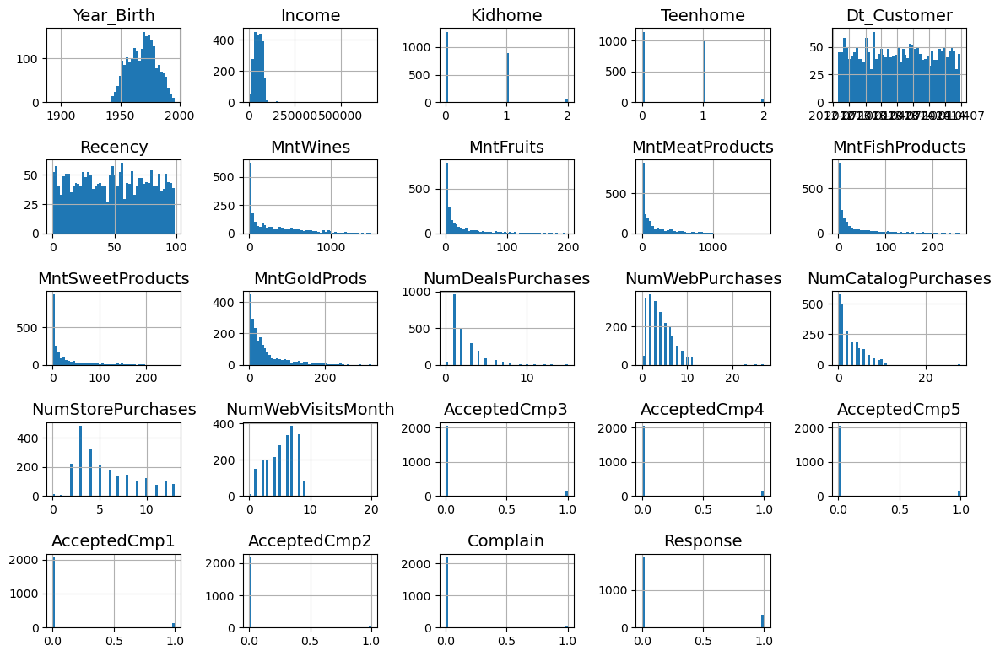

In [20]:
plt.rc('font', size=14)
plt.rc('axes', labelsize=14, titlesize=14)
plt.rc('legend', fontsize=14)
plt.rc('xtick', labelsize=10)
plt.rc('ytick', labelsize=10)

customer.hist(bins=50, figsize=(12, 8))
plt.tight_layout()  # Adjust the spacing
plt.show()

#Creating a feature ("Customer_For") of the number of days the customers started to shop in the store relative to the last recorded date

In [22]:
dates = []
for i in customer["Dt_Customer"]:
    i = i.date()
    dates.append(i) 

enroll_days = []
d1 = max(dates) #taking it to be the newest customer
for i in dates:
    delta = d1 - i
    enroll_days.append(delta)
customer["Customer_For"] = enroll_days
customer["Customer_For"] = pd.to_numeric(customer["Customer_For"], errors="coerce")

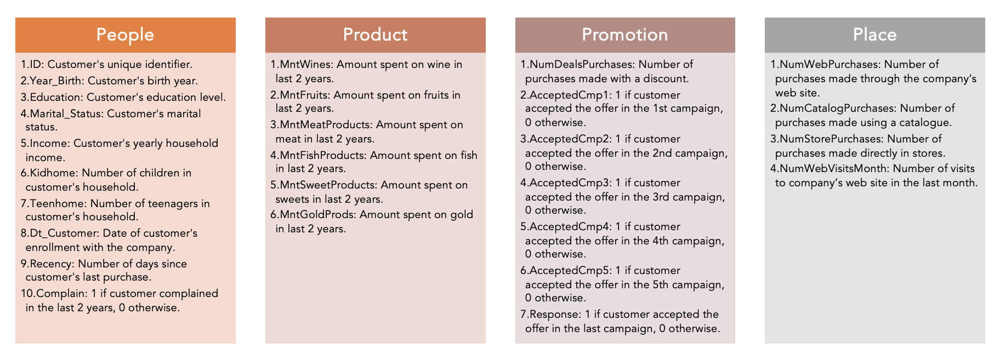

In [24]:
from IPython.display import Image

# Display an image by directly specifying the filename
Image(filename='/Users/liujingna/Desktop/Screenshot 2024-02-07 at 3.01.38 PM.png')  # Replace 'path_to_image.jpg' with your image file path

In [27]:
customer['Education'].unique()

array(['Graduation', 'PhD', 'Master', 'Basic', '2n Cycle'], dtype=object)

In [28]:
customer['Education'] = customer['Education'].replace(['PhD','2n Cycle','Graduation', 'Master'],'postgraduate')  
customer['Education'] = customer['Education'].replace(['Basic'], 'undergraduate')

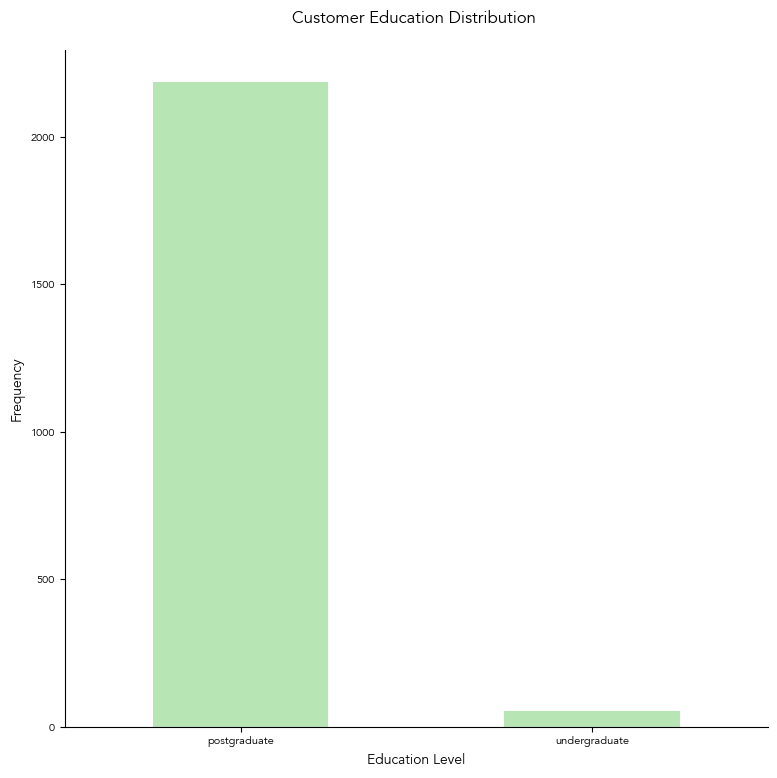

In [42]:
rcParams['font.family'] = 'Avenir'

plt.figure(figsize=(8, 8))
customer['Education'].value_counts().plot(kind='bar', color='#B7E5B4', linewidth=3)
plt.title("Customer Education Distribution \n", fontsize=12)
plt.xlabel("Education Level", fontsize=10)
plt.ylabel("Frequency", fontsize=10)
plt.xticks(rotation=0, fontsize=8)  # Rotate x-axis labels for better readability
plt.yticks(fontsize=8)

plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)

plt.tight_layout()

# Show the plot
plt.show()

In [43]:
customer['Marital_Status'].unique()

array(['Single', 'Together', 'Married', 'Divorced', 'Widow', 'Alone',
       'Absurd', 'YOLO'], dtype=object)

In [44]:
customer['Marital_Status'] = customer['Marital_Status'].replace(['Married', 'Together'],'Relationship')
customer['Marital_Status'] = customer['Marital_Status'].replace(['Divorced', 'Widow', 'Alone', 'YOLO', 'Absurd'],'Single')

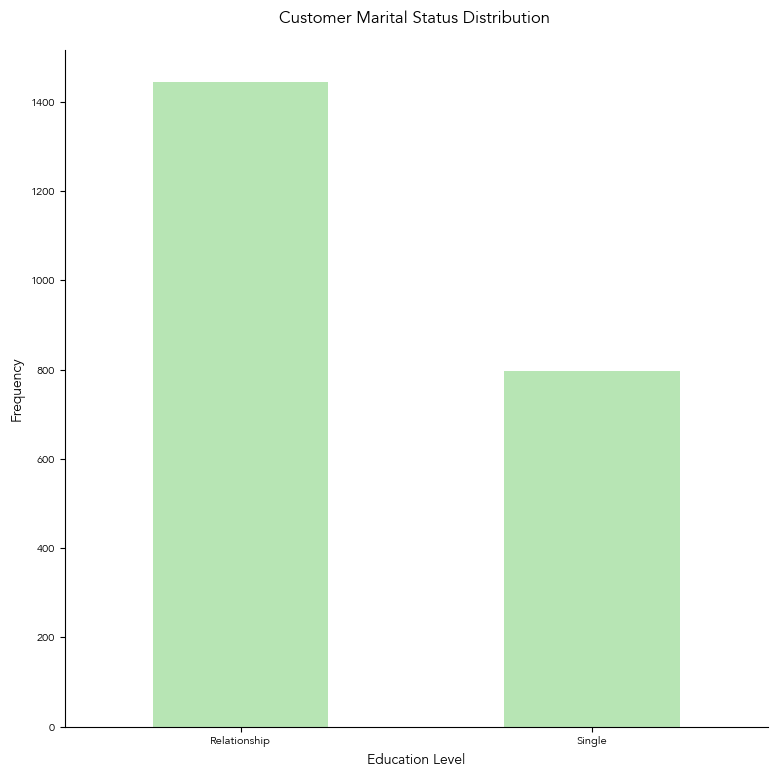

In [45]:
rcParams['font.family'] = 'Avenir'

plt.figure(figsize=(8, 8))
customer['Marital_Status'].value_counts().plot(kind='bar', color='#B7E5B4', linewidth=3)
plt.title("Customer Marital Status Distribution \n", fontsize=12)
plt.xlabel("Education Level", fontsize=10)
plt.ylabel("Frequency", fontsize=10)
plt.xticks(rotation=0, fontsize=8)  # Rotate x-axis labels for better readability
plt.yticks(fontsize=8)

plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)

plt.tight_layout()

# Show the plot
plt.show()

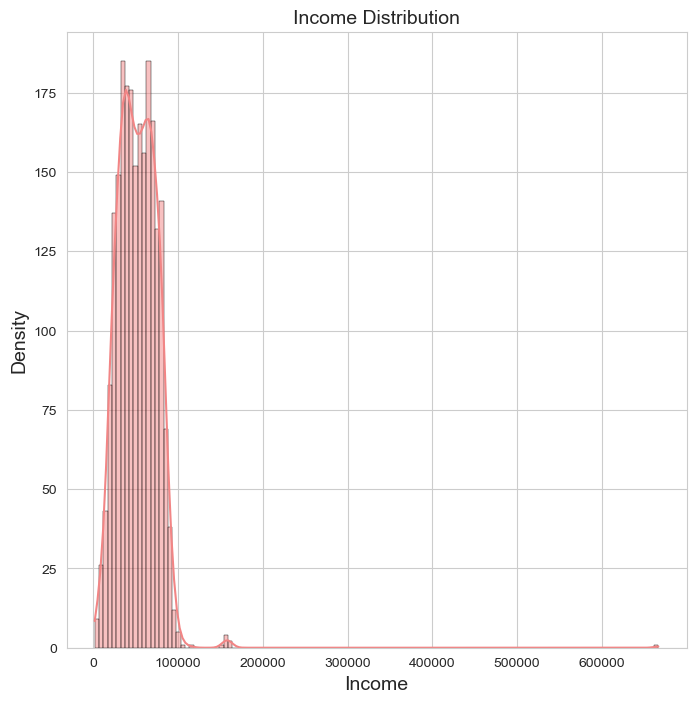

In [46]:
sns.set_style("whitegrid")

# Plot the distribution of Income using Seaborn's distplot
plt.figure(figsize=(8, 8))
sns.histplot(customer["Income"], kde=True, color='#F28585', edgecolor='black')
plt.title('Income Distribution')
plt.xlabel('Income')
plt.ylabel('Density')
plt.show()

In [57]:
import pandas_profiling

profile = customer.profile_report()
# Display the report
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [58]:
customer['Kids'] = customer['Kidhome'] + customer['Teenhome']

customer['Expenses'] = customer['MntWines'] + customer['MntFruits'] + customer['MntMeatProducts'] + customer['MntFishProducts'] + customer['MntSweetProducts'] + customer['MntGoldProds']
customer['Expenses'].head(10)

customer['TotalAcceptedCmp'] = customer['AcceptedCmp1'] + customer['AcceptedCmp2'] + customer['AcceptedCmp3'] + customer['AcceptedCmp4'] + customer['AcceptedCmp5']

customer['NumTotalPurchases'] = customer['NumWebPurchases'] + customer['NumCatalogPurchases'] + customer['NumStorePurchases'] + customer['NumDealsPurchases']
customer['NumTotalPurchases'].unique()

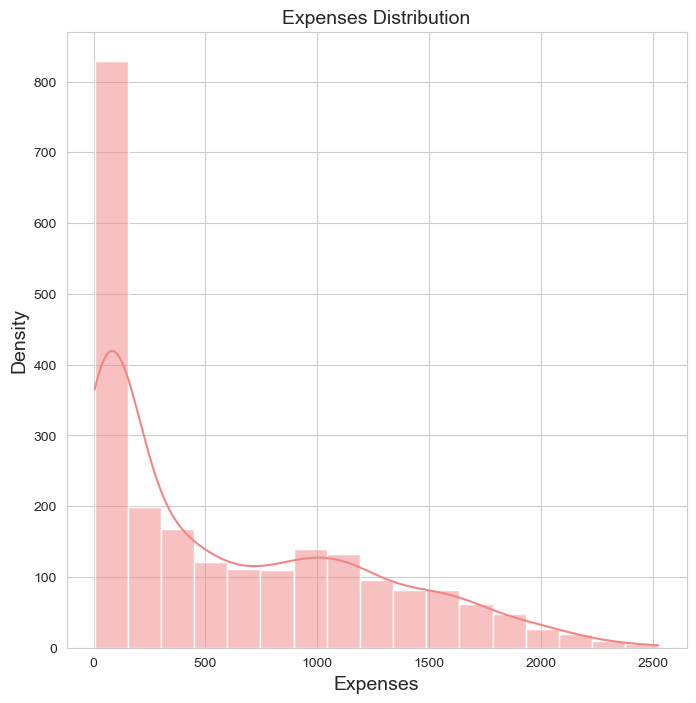

In [65]:
sns.set_style("whitegrid")

# Plot the distribution of Income using Seaborn's distplot
plt.figure(figsize=(8, 8))
sns.histplot(customer["Expenses"], kde=True, color='#F28585')
plt.title('Expenses Distribution')
plt.xlabel('Expenses')
plt.ylabel('Density')
plt.show()

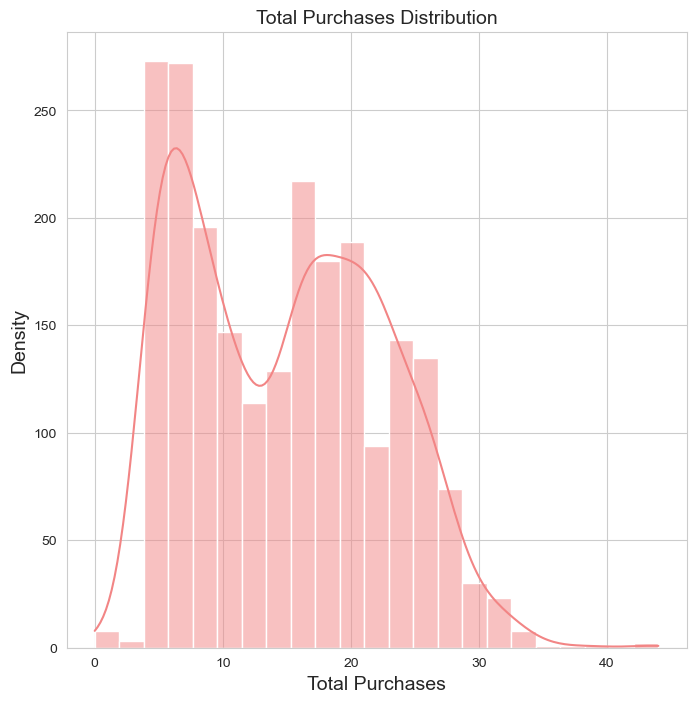

In [67]:
sns.set_style("whitegrid")

# Plot the distribution of Income using Seaborn's distplot
plt.figure(figsize=(8, 8))
sns.histplot(customer["NumTotalPurchases"], kde=True, color='#F28585')
plt.title('Total Purchases Distribution')
plt.xlabel('Total Purchases')
plt.ylabel('Density')
plt.show()